## Cell 1 — Install Dependencies

In [1]:
!pip install ultralytics timm scikit-learn -q
import ultralytics, timm, torch
print("ultralytics:", ultralytics.__version__)
print("timm       :", timm.__version__)
print("torch      :", torch.__version__, "| CUDA:", torch.cuda.is_available())


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 75.7 MB/s eta 0:00:00:00:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires nu

## Cell 2 — Imports & Global Config

In [2]:
import os, sys, json, random, warnings, math
import numpy as np
import cv2
from pathlib import Path
from PIL import Image
from collections import Counter, defaultdict
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torch.amp import autocast

import timm
from ultralytics import YOLO

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
USE_AMP = torch.cuda.is_available()
N_GPUS  = torch.cuda.device_count()
print(f"Device : {DEVICE} | GPUs: {N_GPUS} | AMP: {USE_AMP}")


Device : cuda | GPUs: 2 | AMP: True


## Cell 3 — Model Paths  ← **عدّل هنا**

In [3]:
CVV_MODELS_DIR = "/kaggle/input/notebooks/moaztest/classification-162gardinercode/cvv_models"

In [4]:
# ================================================================
#  ★  عدّل المسارات دي حسب بيئتك
# ================================================================

# Layout YOLO-seg  (output of layout-final notebook)
#/kaggle/input/notebooks/freedie28/layout-final/hla_yolo/images/train/00.4.60_EGDP018075.jpg
LAYOUT_WEIGHTS  = '/kaggle/input/notebooks/freedie28/layout-final/runs/layout_analysis/weights/best.pt'
LAYOUT_IMG_SIZE = 1024          # trained at 1024

# Sign / glyph YOLO detector  (output of sign-segment-final notebook)
#/kaggle/input/notebooks/freedie28/sign-segment-final/big-new-2-1/labels_original_803class/test/Egyptian-hieroglyphs-stock-image_-Image-of-alphabet-sculpted-4995767_jpg.rf.50fe2ee7d4215ab083d569221a9de16e.txt

SIGN_WEIGHTS    = '/kaggle/input/notebooks/freedie28/sign-segment-final/runs/detect/hieroglyph_yolo/yolo_single_class/weights/best.pt'
SIGN_IMG_SIZE   = 640           # trained at 640

# ConvNeXt CVV folds  (output of classification notebook)
#CVV_MODELS_DIR  = 'cvv_models'  # folder containing fold_0_final.pt … fold_4_final.pt
K_FOLDS         = 5

# ── Classification hypers (must match training) ──────────────────
IMG_SIZE          = 224
CONVNEXT_BACKBONE = 'convnext_base'
DROP_PATH_RATE    = 0.10
HEAD_DROPOUT      = 0.20

# ── Class mappings  (auto-loaded from cvv_models/label_maps.json) ─
LABEL_MAPS_PATH = os.path.join(CVV_MODELS_DIR, 'label_maps.json')
assert os.path.exists(LABEL_MAPS_PATH), \
    f"label_maps.json not found at {LABEL_MAPS_PATH}.\n" \
    "Run the classification notebook first to produce cvv_models/label_maps.json"

with open(LABEL_MAPS_PATH) as f:
    _lm = json.load(f)

# CLASS_NAMES  = _lm['CLASS_NAMES']
# CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
# IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}
# NUM_CLASSES  = len(CLASS_NAMES)

# DIRECTIONS     = ['dual', 'left', 'right']
# DIR_TO_IDX     = {d: i for i, d in enumerate(DIRECTIONS)}
# IDX_TO_DIR     = {i: d for d, i in DIR_TO_IDX.items()}
# NUM_DIRECTIONS = len(DIRECTIONS)

CLASS_NAMES = _lm['sign_classes']

CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
IDX_TO_CLASS = {i: c for i, c in enumerate(CLASS_NAMES)}

NUM_CLASSES = len(CLASS_NAMES)

DIRECTIONS = _lm['directions']

DIR_TO_IDX = {d: i for i, d in enumerate(DIRECTIONS)}
IDX_TO_DIR = {i: d for i, d in enumerate(DIRECTIONS)}

NUM_DIRECTIONS = len(DIRECTIONS)




print(f"Classes loaded  : {NUM_CLASSES}")
print(f"Layout weights  : {LAYOUT_WEIGHTS}")
print(f"Sign weights    : {SIGN_WEIGHTS}")
print(f"CVV models dir  : {CVV_MODELS_DIR}")


Classes loaded  : 162
Layout weights  : /kaggle/input/notebooks/freedie28/layout-final/runs/layout_analysis/weights/best.pt
Sign weights    : /kaggle/input/notebooks/freedie28/sign-segment-final/runs/detect/hieroglyph_yolo/yolo_single_class/weights/best.pt
CVV models dir  : /kaggle/input/notebooks/moaztest/classification-162gardinercode/cvv_models


In [5]:
print(_lm.keys())

dict_keys(['sign_classes', 'directions', 'img_size', 'backbone', 'num_classes', 'num_directions'])


In [6]:
print(type(_lm["sign_classes"]))
print(len(_lm["sign_classes"]))
print(_lm["sign_classes"][:5])

print(_lm["directions"])

<class 'list'>
162
['a1', 'a19', 'a2', 'a24', 'a30']
['dual', 'left', 'right']


## Cell 4 — Preprocessing (Letterbox — same as training)

In [7]:
MEAN, STD = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

FLIP_DIR = {DIR_TO_IDX['dual']:  DIR_TO_IDX['dual'],
            DIR_TO_IDX['left']:  DIR_TO_IDX['right'],
            DIR_TO_IDX['right']: DIR_TO_IDX['left']}


class LetterboxResize:
    """Aspect-preserving resize + median-colour padding (same fix as training)."""
    def __init__(self, size=IMG_SIZE):
        self.size = size

    def __call__(self, img):
        w, h   = img.size
        scale  = self.size / max(w, h)
        nw, nh = max(1, round(w * scale)), max(1, round(h * scale))
        img    = img.resize((nw, nh), Image.Resampling.LANCZOS)
        arr    = np.asarray(img)
        if arr.ndim == 2:
            arr = np.stack([arr] * 3, axis=-1)
        border = np.concatenate([arr[0,:,:], arr[-1,:,:],
                                 arr[:,0,:], arr[:,-1,:]], axis=0)
        fill   = tuple(int(c) for c in np.median(border, axis=0))
        canvas = Image.new('RGB', (self.size, self.size), fill)
        canvas.paste(img, ((self.size - nw) // 2, (self.size - nh) // 2))
        return canvas


val_tfm = T.Compose([
    LetterboxResize(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(MEAN, STD),
])

print("val_tfm (letterbox) ready ✓")


val_tfm (letterbox) ready ✓


## Cell 5 — Dual-Head ConvNeXt Model Definition

In [8]:
class DualHeadConvNeXt(nn.Module):
    def __init__(self, num_signs, num_directions,
                 backbone_name=CONVNEXT_BACKBONE, pretrained=False):
        super().__init__()

        self.backbone = timm.create_model(
            backbone_name,
            pretrained=pretrained,
            drop_path_rate=DROP_PATH_RATE,
            num_classes=0,
        )

        feat = self.backbone.num_features

        self.sign_head = nn.Linear(feat, num_signs)
        self.dir_head  = nn.Linear(feat, num_directions)

    def forward(self, x):
        f = self.backbone(x)
        return self.sign_head(f), self.dir_head(f)


def build_model(pretrained=False):
    return DualHeadConvNeXt(
        NUM_CLASSES,
        NUM_DIRECTIONS,
        pretrained=pretrained
    ).to(DEVICE)

## Cell 6 — Load Models

In [9]:
# ── Layout model (YOLO-seg) ──────────────────────────────────────
assert os.path.exists(LAYOUT_WEIGHTS), \
    f"Layout weights not found: {LAYOUT_WEIGHTS}"
layout_model = YOLO(LAYOUT_WEIGHTS)
print(f"Layout model loaded   : {LAYOUT_WEIGHTS}")
print(f"  classes: {layout_model.names}")

# ── Validate class IDs match training convention ──────────────────
_names = layout_model.names
_line_id = next((k for k, v in _names.items() if 'line' in v.lower()), None)
_cart_id = next((k for k, v in _names.items() if 'cart' in v.lower()), None)
assert _line_id == 0, (
    f"Layout model has 'line' at class id {_line_id}, expected 0. "
    f"Full mapping: {_names}. Fix LINE_CLASS / CARTOUCHE_CLASS in Cell 7."
)
assert _cart_id == 1, (
    f"Layout model has 'cartouche' at class id {_cart_id}, expected 1. "
    f"Full mapping: {_names}. Fix CARTOUCHE_CLASS in Cell 7."
)
print("  ✓ Class IDs verified: line=0, cartouche=1")

# ── Sign detector (single-class YOLO) ────────────────────────────
assert os.path.exists(SIGN_WEIGHTS), \
    f"Sign weights not found: {SIGN_WEIGHTS}"
sign_model = YOLO(SIGN_WEIGHTS)
print(f"Sign model loaded     : {SIGN_WEIGHTS}")

# ── CVV classification folds ──────────────────────────────────────
def get_inference_models():
    ms = []
    for i in range(K_FOLDS):
        p = os.path.join(CVV_MODELS_DIR, f'fold_{i}_final.pt')
        if os.path.exists(p):
            m = build_model(pretrained=False).to(DEVICE)
            m.load_state_dict(torch.load(p, map_location=DEVICE, weights_only=True))
            m.eval()
            ms.append(m)
    if not ms:
        raise RuntimeError(
            f"No CVV models found in '{CVV_MODELS_DIR}'.\n"
            "Run classification notebook first."
        )
    print(f"CVV models loaded     : {len(ms)} folds from '{CVV_MODELS_DIR}'")
    return ms

cvv_models = get_inference_models()


Layout model loaded   : /kaggle/input/notebooks/freedie28/layout-final/runs/layout_analysis/weights/best.pt
  classes: {0: 'Line', 1: 'Cartouche'}
  ✓ Class IDs verified: line=0, cartouche=1
Sign model loaded     : /kaggle/input/notebooks/freedie28/sign-segment-final/runs/detect/hieroglyph_yolo/yolo_single_class/weights/best.pt
CVV models loaded     : 5 folds from '/kaggle/input/notebooks/moaztest/classification-162gardinercode/cvv_models'


In [10]:
p = os.path.join(CVV_MODELS_DIR, "fold_0_final.pt")

sd = torch.load(p, map_location="cpu", weights_only=True)

print([k for k in sd.keys() if "sign_head" in k])
print([k for k in sd.keys() if "dir_head" in k])

['sign_head.weight', 'sign_head.bias']
['dir_head.weight', 'dir_head.bias']


## Cell 7 — Pipeline Helper Functions

In [11]:
# ================================================================
#  Stage 1 helpers — Layout polygon extraction
# ================================================================
LINE_CLASS      = 0     # class 0 = Line
CARTOUCHE_CLASS = 1     # class 1 = Cartouche


def _layout_polygons(image_path, layout_model=layout_model, conf=0.25):
    """Run layout model, return (line_polys, cart_polys).
    Each poly is an (N,2) int32 pixel-coordinate array.
    Cartouches are returned for completeness but not used downstream.
    """
    res = layout_model.predict(str(image_path), conf=conf,
                               imgsz=LAYOUT_IMG_SIZE, verbose=False)[0]
    line_polys, cart_polys = [], []
    if res.masks is None or res.boxes is None:
        return line_polys, cart_polys
    classes = res.boxes.cls.cpu().numpy().astype(int)
    for cls_id, poly in zip(classes, res.masks.xy):
        poly = np.asarray(poly, dtype=np.int32)
        if poly.shape[0] < 3:
            continue
        if cls_id == LINE_CLASS:
            line_polys.append(poly)
        elif cls_id == CARTOUCHE_CLASS:
            cart_polys.append(poly)
    print(f"  Layout: {len(line_polys)} lines  |  {len(cart_polys)} cartouches (skipped)")
    return line_polys, cart_polys


# ================================================================
#  Stage 2 helper — Sign segmentation (Lines only, per-line crop)
# ================================================================
def segment_signs_lines_only_perline(image_path,
                                     layout_model=layout_model,
                                     sign_model=sign_model,
                                     layout_conf=0.25, sign_conf=0.25, pad=4,
                                     line_polys=None):
    # Bug-4 fix: accept pre-computed line_polys to avoid running layout model twice
    """Crop each Line polygon's bbox (real background) and detect signs inside.
    No black-masking: the detector sees natural pixels (matches pipeline.py).
    Cartouches are never passed to the glyph model.

    Returns list of [x1,y1,x2,y2,conf] in FULL-IMAGE pixel coords.
    """
    img = cv2.imread(str(image_path))
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {image_path}")
    H, W = img.shape[:2]
    if line_polys is None:          # Bug-4 fix: only run layout model when needed
        line_polys, _ = _layout_polygons(image_path, layout_model, layout_conf)

    signs = []
    for poly in line_polys:
        x1, y1 = int(poly[:,0].min()), int(poly[:,1].min())
        x2, y2 = int(poly[:,0].max()), int(poly[:,1].max())
        x1, y1 = max(0, x1 - pad), max(0, y1 - pad)
        x2, y2 = min(W, x2 + pad), min(H, y2 + pad)
        if x2 <= x1 or y2 <= y1:
            continue
        # FIX: do NOT black-mask outside the polygon. cv2.bitwise_and zeroes
        # every pixel outside the line, leaving a hard BLACK frame around the
        # content. That crop is OUT-OF-DISTRIBUTION for the sign detector (it was
        # trained on natural crops), so YOLO fires ONE giant detection on the
        # whole content blob -> a phantom full-line box (classified e.g. "z1"
        # @ 0.09). Use the plain real-background bbox crop, exactly like the
        # working local pipeline.py. iou=0.5 also matches pipeline.py's NMS.
        crop = img[y1:y2, x1:x2]
        if crop.size == 0:
            continue
        det = sign_model.predict(crop, conf=sign_conf, iou=0.5,
                                 imgsz=SIGN_IMG_SIZE, verbose=False)[0]
        if det.boxes is None or len(det.boxes) == 0:
            continue
        for b, c in zip(det.boxes.xyxy.cpu().numpy(),
                        det.boxes.conf.cpu().numpy()):
            signs.append([float(b[0]) + x1, float(b[1]) + y1,
                          float(b[2]) + x1, float(b[3]) + y1, float(c)])
    return signs


# ================================================================
#  Stage 3 helper — Extract glyph crops from full image
# ================================================================
def extract_glyph_crops(image_pil, sign_boxes):
    """Crop each bounding box [x1,y1,x2,y2,conf] from the PIL image.
    Returns list of PIL.Image crops.
    """
    crops = []
    W, H  = image_pil.size
    for box in sign_boxes:
        x1, y1, x2, y2 = (int(round(v)) for v in box[:4])
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(W, x2), min(H, y2)
        if x2 > x1 and y2 > y1:
            crops.append(image_pil.crop((x1, y1, x2, y2)))
    return crops


# ================================================================
#  Stage 4 helpers — Classification (CVV ensemble)
# ================================================================
def _to_pil(crop):
    if isinstance(crop, Image.Image):  return crop.convert('RGB')
    if isinstance(crop, np.ndarray):   return Image.fromarray(crop).convert('RGB')
    if isinstance(crop, str):          return Image.open(crop).convert('RGB')
    raise TypeError(f"Unsupported crop type: {type(crop)}")


@torch.no_grad()
def predict_crops(crops, models=None, voting='soft', batch_size=64):
    """Classify a list of sign crops with the CVV ensemble.

    Parameters
    ----------
    crops      : list of PIL.Image / np.ndarray / file paths.
    models     : trained DualHeadConvNeXt models (default: cvv_models loaded above).
    voting     : 'soft' (mean probabilities) or 'hard' (modal vote).
    batch_size : forward-pass batch size.

    Returns
    -------
    list of dicts per crop:
        {gardiner, sign, direction, sign_conf, dir_conf, sign_idx, dir_idx}
    """
    models = models or cvv_models
    for m in models:
        m.eval()
    if not crops:
        return []

    X = torch.stack([val_tfm(_to_pil(c)) for c in crops])
    sign_chunks, dir_chunks = [], []

    for i in range(0, len(X), batch_size):
        xb = X[i:i + batch_size].to(DEVICE, non_blocking=True)
        sp_k, dp_k = [], []
        for m in models:
            with autocast('cuda', enabled=USE_AMP):
                so, do = m(xb)
            sp_k.append(F.softmax(so.float(), 1).cpu())
            dp_k.append(F.softmax(do.float(), 1).cpu())
        sp_k, dp_k = torch.stack(sp_k), torch.stack(dp_k)
        if voting == 'soft':
            sign_chunks.append(sp_k.mean(0))
            dir_chunks.append(dp_k.mean(0))
        else:
            s_idx = sp_k.argmax(-1).mode(0).values
            d_idx = dp_k.argmax(-1).mode(0).values
            sign_chunks.append(F.one_hot(s_idx, NUM_CLASSES).float())
            dir_chunks.append(F.one_hot(d_idx, NUM_DIRECTIONS).float())

    sign_p = torch.cat(sign_chunks, 0)
    dir_p  = torch.cat(dir_chunks, 0)

    out = []
    for sp, dp in zip(sign_p, dir_p):
        si, di = int(sp.argmax()), int(dp.argmax())
        name = IDX_TO_CLASS[si]
        out.append({
            'gardiner':  name,
            'sign':      name,
            'direction': IDX_TO_DIR[di],
            'sign_conf': float(sp[si]),
            'dir_conf':  float(dp[di]),
            'sign_idx':  si,
            'dir_idx':   di,
        })
    return out


# ================================================================
#  Reading-order sorter (LASC paper formula)
# ================================================================
LEFT_, RIGHT_, DUAL_ = 'left', 'right', 'dual'
LTR_,  RTL_          = 'ltr',  'rtl'


def vote_direction(signs, tie_default=LTR_):
    left = right = 0
    for s in signs:
        d = s.get('direction')
        if   d == LEFT_:  left  += 1
        elif d == RIGHT_: right += 1
    if right > left:  return RTL_
    if left  > right: return LTR_
    return tie_default


def lasc_score(bbox, width, direction):
    x1, y1, x2, y2 = bbox
    if direction == RTL_:
        x1 = width - x1
        x2 = width - x2
    return math.hypot(x1, y1) + abs(x2) + abs(y2)


def sort_signs(signs, line_w, direction=None):
    direction = direction or vote_direction(signs)
    for s in signs:
        s['_score'] = lasc_score(s['bbox'], line_w, direction)
    signs_sorted = sorted(signs, key=lambda s: s['_score'])
    for pos, s in enumerate(signs_sorted, start=1):
        s['position'] = pos
    return signs_sorted


def sort_lines(lines, image_w, direction=LTR_):
    for ln in lines:
        x1, y1, x2, y2 = ln['bbox']
        ln['_score'] = lasc_score((x1, y1, x2, y2), image_w, direction)
    lines_sorted = sorted(lines, key=lambda l: l['_score'])
    for no, ln in enumerate(lines_sorted, start=1):
        ln['line_no'] = no
    return lines_sorted


print("All pipeline helpers ready ✓")


All pipeline helpers ready ✓


## Cell 8 — Main Pipeline Function

In [12]:
def run_pipeline(image_path, layout_conf=0.25, sign_conf=0.25,
                force_direction=None, batch_size=64, verbose=True):
    """
    Full end-to-end pipeline:
        Image → Layout (lines only) → Sign Segmentation
              → Glyph Crops → Classification → Reading Order

    Parameters
    ----------
    image_path       : str or Path to the artifact image.
    layout_conf      : confidence threshold for layout model.
    sign_conf        : confidence threshold for sign detector.
    force_direction  : 'ltr' or 'rtl' to override auto-voting, else None.
    batch_size       : batch size for CVV classification.
    verbose          : print progress.

    Returns
    -------
    ordered_lines : list of line dicts, each containing:
        {
          'line_no'    : int,
          'bbox'       : (x1,y1,x2,y2),   # full-image coords
          'signs'      : [                  # in reading order
              { 'position', 'gardiner', 'direction',
                'sign_conf', 'dir_conf', 'bbox' }, ...
          ],
          '_dir'       : 'ltr'|'rtl',
        }
    artifact_dir  : voted reading direction ('ltr'|'rtl')
    sign_boxes_all: raw sign boxes [[x1,y1,x2,y2,conf], ...]
    """
    image_path = Path(image_path)
    assert image_path.exists(), f"Image not found: {image_path}"
    image_pil  = Image.open(image_path).convert('RGB')
    img_w, img_h = image_pil.size

    if verbose:
        print(f"\n{'='*60}")
        print(f"  PIPELINE: {image_path.name}  ({img_w}×{img_h})")
        print(f"{'='*60}")

    # ── Stage 1: Layout Analysis ──────────────────────────────────
    if verbose: print("\n[Stage 1] Layout Analysis...")
    line_polys, _ = _layout_polygons(image_path, layout_model, layout_conf)
    if not line_polys:
        if verbose: print("  ⚠ No lines detected. Check image or layout_conf threshold.")
        return [], None, []

    # ── Stage 2: Sign Segmentation (Lines only) ───────────────────
    if verbose: print("\n[Stage 2] Sign Segmentation (Lines only)...")
    sign_boxes_all = segment_signs_lines_only_perline(
        image_path, layout_model, sign_model, layout_conf, sign_conf,
        line_polys=line_polys              # Bug-4 fix: reuse polys, skip 2nd layout run
    )
    if verbose: print(f"  Total signs detected: {len(sign_boxes_all)}")

    # ── Build lines structure: bbox + sign_bboxes in line-crop coords ──────
    # Read image once as numpy array for polygon ops
    img_np = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)
    H_np, W_np = img_np.shape[:2]

    STAGE_PAD = 4   # same 4-px pad used in Stage 2 (segment_signs_lines_only_perline)

    assigned_box_indices = set()   # Bug-5 fix: each sign assigned to at most one line
    lines = []
    for poly in line_polys:
        x1_l = max(0,    int(poly[:,0].min()) - STAGE_PAD)
        y1_l = max(0,    int(poly[:,1].min()) - STAGE_PAD)
        x2_l = min(W_np, int(poly[:,0].max()) + STAGE_PAD)
        y2_l = min(H_np, int(poly[:,1].max()) + STAGE_PAD)
        sb = []
        for idx, box in enumerate(sign_boxes_all):
            if idx in assigned_box_indices:    # Bug-5 fix: skip already-assigned
                continue
            cx = float((box[0] + box[2]) / 2)
            cy = float((box[1] + box[3]) / 2)
            if cv2.pointPolygonTest(poly.astype(np.float32), (cx, cy), False) >= 0:
                assigned_box_indices.add(idx)  # Bug-5 fix: mark assigned
                # convert to line-crop coordinates
                bx1 = max(0,           box[0] - x1_l)
                by1 = max(0,           box[1] - y1_l)
                bx2 = min(x2_l - x1_l, box[2] - x1_l)
                by2 = min(y2_l - y1_l, box[3] - y1_l)
                if bx2 > bx1 and by2 > by1:
                    sb.append((bx1, by1, bx2, by2))
        # FIX: use the PLAIN real-background bbox crop for classification, NOT a
        # polygon-masked (black-bg) crop. The ConvNeXt CVV was trained on natural
        # crops; black-masked crops are a train/serve skew that drops confidence.
        # This matches the working local pipeline.py exactly. The polygon is kept
        # only so the visualiser can draw the green region fill.
        line_pil = image_pil.crop((x1_l, y1_l, x2_l, y2_l))
        lines.append({
            'bbox':        (float(x1_l), float(y1_l), float(x2_l), float(y2_l)),
            'sign_bboxes': sb,
            'crop':        line_pil,     # ← plain real-background PIL crop
            'poly':        poly,         # ← kept for the green mask overlay
            'is_cartouche': False,
        })

    if verbose:
        for i, ln in enumerate(lines):
            print(f"  Line {i+1}: bbox={ln['bbox']}  signs={len(ln['sign_bboxes'])}")

    # ── Stage 3 + 4: Classify & Order (classify_and_order_artifact logic) ──
    if verbose: print("\n[Stage 3+4] Classification + Reading Order...")

    enriched = []
    for ln in lines:
        x1, y1, x2, y2 = map(int, ln['bbox'])
        # FIX: classify on the plain real-background crop (matches pipeline.py)
        line_crop = ln['crop']
        bbs   = ln['sign_bboxes']
        if not bbs:
            enriched.append({**ln, 'signs': []})
            continue
        imgs  = [line_crop.crop(tuple(map(int, bb))) for bb in bbs]
        preds = predict_crops(imgs, batch_size=batch_size)
        signs = [{'bbox': tuple(map(float, bb)), **p}
                 for bb, p in zip(bbs, preds)]
        enriched.append({**ln, 'signs': signs})

    # ── Vote artifact reading direction ──────────────────────────
    all_signs = [s for ln in enriched for s in ln['signs']]
    artifact_dir = (force_direction
                    if force_direction is not None
                    else vote_direction(all_signs))
    if verbose:
        print(f"  Artifact reading direction: {artifact_dir.upper()}")

    # ── Sort lines, then signs within each line ───────────────────
    sorted_lines = sort_lines(enriched, image_w=img_w, direction=artifact_dir)
    for ln in sorted_lines:
        x1, _, x2, _ = ln['bbox']
        ln['signs']  = sort_signs(ln['signs'], line_w=(x2 - x1), direction=artifact_dir)
        ln['_dir']   = artifact_dir

    if verbose:
        print(f"\n  Done. {len(sorted_lines)} lines, "
              f"{sum(len(l['signs']) for l in sorted_lines)} signs classified.")

    return sorted_lines, artifact_dir, sign_boxes_all


def transcription_string(ordered_lines, sep_sign=' ', sep_line=' | ', numbered=False):
    """Flatten pipeline output to a readable transcription string."""    
    parts = []
    for ln in ordered_lines:
        if numbered:
            parts.append(sep_sign.join(
                f"{s['position']}:{s['gardiner']}" for s in ln['signs']
            ))
        else:
            parts.append(sep_sign.join(s['gardiner'] for s in ln['signs']))
    return sep_line.join(parts)


print("run_pipeline()         ready ✓")
print("transcription_string() ready ✓")


run_pipeline()         ready ✓
transcription_string() ready ✓


## Cell 9 — Run on a Single Image

In [13]:
# ================================================================
#  ★  غيّر المسار ده لصورة الـ artifact اللي عندك
# ================================================================
TEST_IMAGE = '/kaggle/input/datasets/hebaadelali/testimgs-ds/IMG-20260515-WA0044.jpg'   # ← عدّل هنا

ordered_lines, artifact_dir, sign_boxes = run_pipeline(
    image_path      = TEST_IMAGE,
    layout_conf     = 0.25,
    sign_conf       = 0.25,
    force_direction = None,       # None = auto-vote | 'ltr' | 'rtl'
    batch_size      = 64,
    verbose         = True,
)

# ── Print results ─────────────────────────────────────────────────
print("\n" + "="*60)
print("  RESULTS")
print("="*60)
for ln in ordered_lines:
    codes = [s['gardiner'] for s in ln['signs']]
    print(f"Line {ln['line_no']:2d} | {len(codes):3d} signs | {' '.join(codes)}")

print("\nFull transcription:")
print(transcription_string(ordered_lines))



  PIPELINE: IMG-20260515-WA0044.jpg  (1102×103)

[Stage 1] Layout Analysis...
  Layout: 1 lines  |  0 cartouches (skipped)

[Stage 2] Sign Segmentation (Lines only)...
  Total signs detected: 43
  Line 1: bbox=(118.0, 0.0, 1098.0, 103.0)  signs=42

[Stage 3+4] Classification + Reading Order...
  Artifact reading direction: RTL

  Done. 1 lines, 42 signs classified.

  RESULTS
Line  1 |  42 signs | z1 q3 m23 x8 r4 x1 z1 d21 d36 n5 z1 g17 v13 r8 z11 d2 d21 n1 r8 r8 r8 o1 d21 d54 g17 v1 x1 o1 x1 u15 u15 aa15 v30 o29 n18 o28 w24 o49 o49 a40 d37 i9

Full transcription:
z1 q3 m23 x8 r4 x1 z1 d21 d36 n5 z1 g17 v13 r8 z11 d2 d21 n1 r8 r8 r8 o1 d21 d54 g17 v1 x1 o1 x1 u15 u15 aa15 v30 o29 n18 o28 w24 o49 o49 a40 d37 i9


## Cell 10 — Batch Run on a Folder

In [14]:
# ================================================================
#  شغّل البايبلاين على كل صور في فولدر
# ================================================================
IMAGES_DIR = '/kaggle/input/datasets/hebaadelali/testimgs-ds'    # ← عدّل هنا
OUT_JSON   = 'pipeline_results.json'

IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
image_paths = sorted([
    p for p in Path(IMAGES_DIR).iterdir()
    if p.suffix.lower() in IMAGE_EXTS
])
print(f"Found {len(image_paths)} images in {IMAGES_DIR}")

all_results = {}
for img_path in tqdm(image_paths, desc='Processing'):
    try:
        ordered_lines, artifact_dir, _ = run_pipeline(
            img_path, verbose=False
        )
        all_results[img_path.name] = {
            'direction':    artifact_dir,
            'transcription': transcription_string(ordered_lines),
            'lines': [
                {
                    'line_no': ln['line_no'],
                    'bbox':    ln['bbox'],
                    'signs': [
                        {
                            'position':  s['position'],
                            'gardiner':  s['gardiner'],
                            'direction': s['direction'],
                            'sign_conf': round(s['sign_conf'], 4),
                            'dir_conf':  round(s['dir_conf'],  4),
                            'bbox':      s['bbox'],
                        }
                        for s in ln['signs']
                    ],
                }
                for ln in ordered_lines
            ],
        }
    except Exception as e:
        print(f"  ⚠ Failed on {img_path.name}: {e}")
        all_results[img_path.name] = {'error': str(e)}

with open(OUT_JSON, 'w', encoding='utf-8') as f:
    json.dump(all_results, f, ensure_ascii=False, indent=2)

print(f"\nResults saved → {OUT_JSON}")
print(f"Processed: {sum(1 for v in all_results.values() if 'error' not in v)} / {len(image_paths)}")


Found 5 images in /kaggle/input/datasets/hebaadelali/testimgs-ds


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

  Layout: 1 lines  |  0 cartouches (skipped)
  Layout: 1 lines  |  0 cartouches (skipped)
  Layout: 4 lines  |  0 cartouches (skipped)
  Layout: 1 lines  |  0 cartouches (skipped)
  Layout: 1 lines  |  0 cartouches (skipped)

Results saved → pipeline_results.json
Processed: 5 / 5


## Cell 11 — Visualise Results on Image (Optional)

  Layout: 0 lines  |  2 cartouches (skipped)

000.png
Lines      : 0
Cartouches : 2


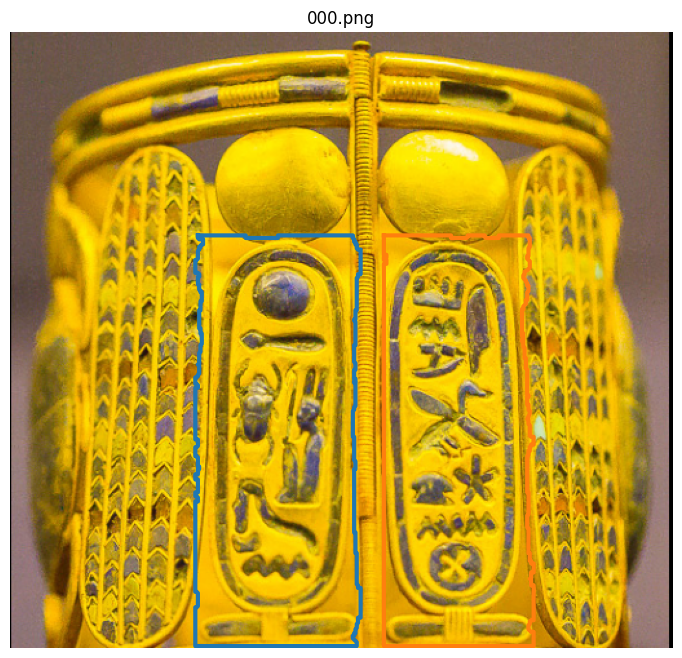

  Layout: 0 lines  |  2 cartouches (skipped)

001.png
Lines      : 0
Cartouches : 2


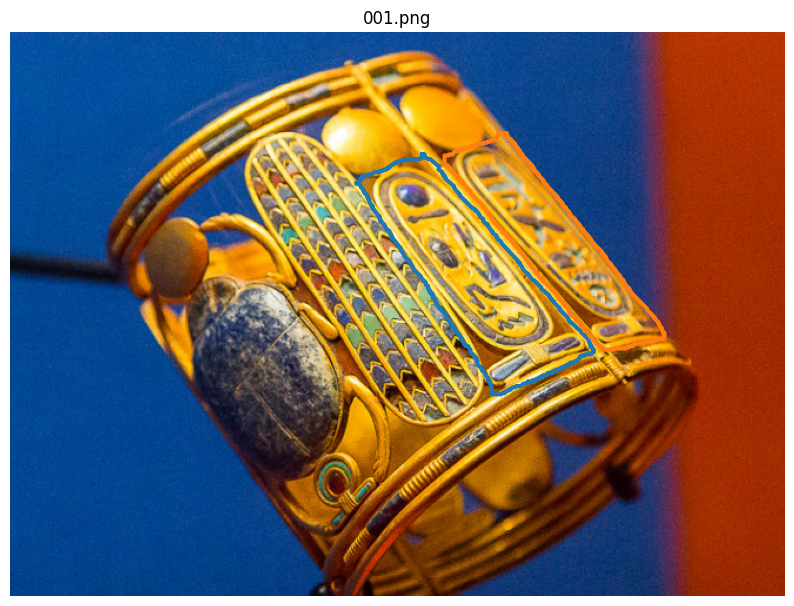

  Layout: 30 lines  |  0 cartouches (skipped)

009.png
Lines      : 30
Cartouches : 0


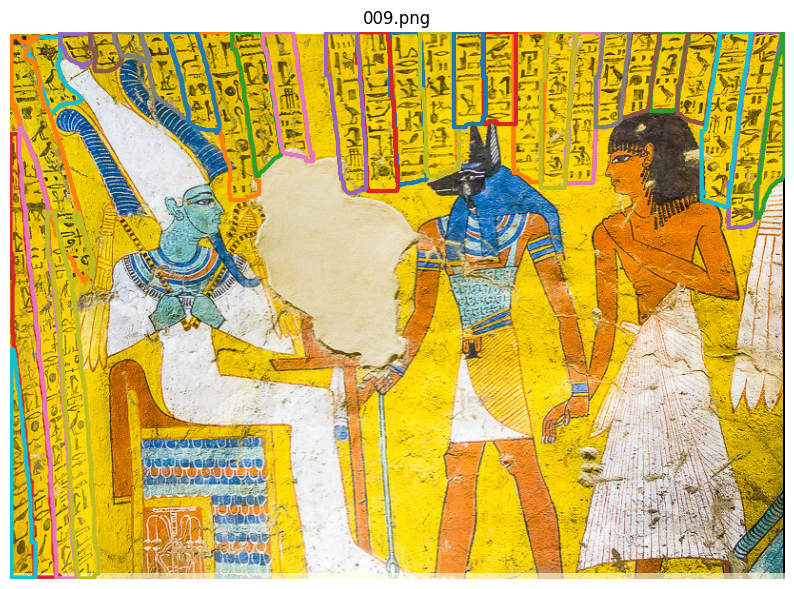

  Layout: 3 lines  |  5 cartouches (skipped)

018.png
Lines      : 3
Cartouches : 5


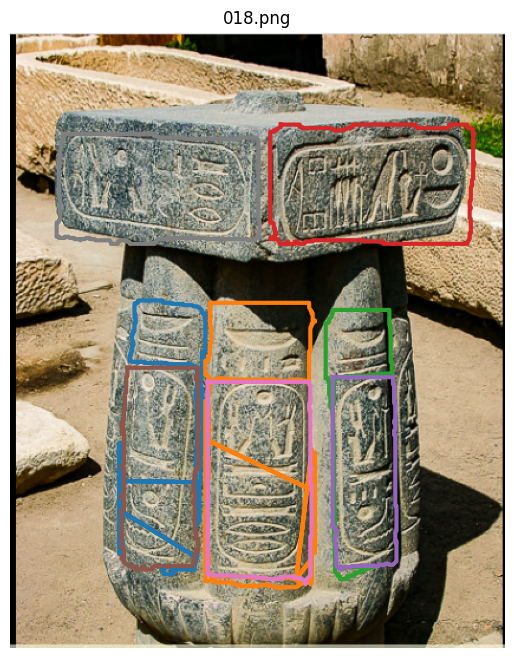

  Layout: 18 lines  |  0 cartouches (skipped)

01903f7df63648fc8f55be60220825e8.full.jpg
Lines      : 18
Cartouches : 0


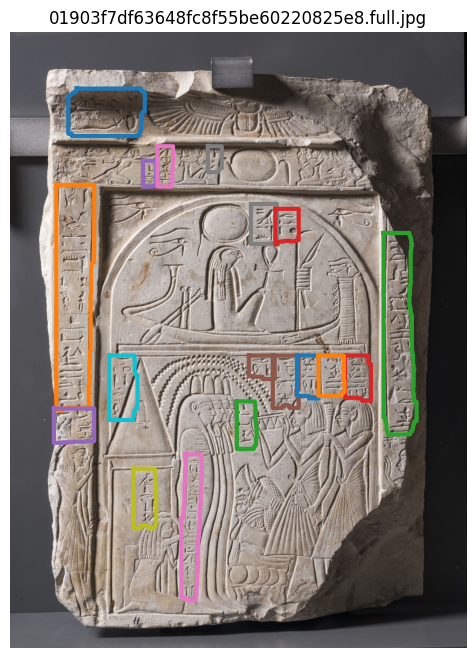

In [15]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np

CARTIUCHE_DIR = "/kaggle/input/datasets/hebaadelali/cartouches"

for img_path in sorted(Path(CARTIUCHE_DIR).glob("*"))[:5]:

    line_polys, cart_polys = _layout_polygons(str(img_path))

    print(f"\n{img_path.name}")
    print(f"Lines      : {len(line_polys)}")
    print(f"Cartouches : {len(cart_polys)}")

    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,8))
    plt.imshow(img)

    for poly in line_polys:
        p = np.vstack([poly, poly[0]])
        plt.plot(p[:,0], p[:,1], linewidth=3)

    for poly in cart_polys:
        p = np.vstack([poly, poly[0]])
        plt.plot(p[:,0], p[:,1], linewidth=3)

    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

  Layout: 0 lines  |  2 cartouches (skipped)

000.png
Lines            : 0
Assigned signs   : 0
Detected boxes   : 0


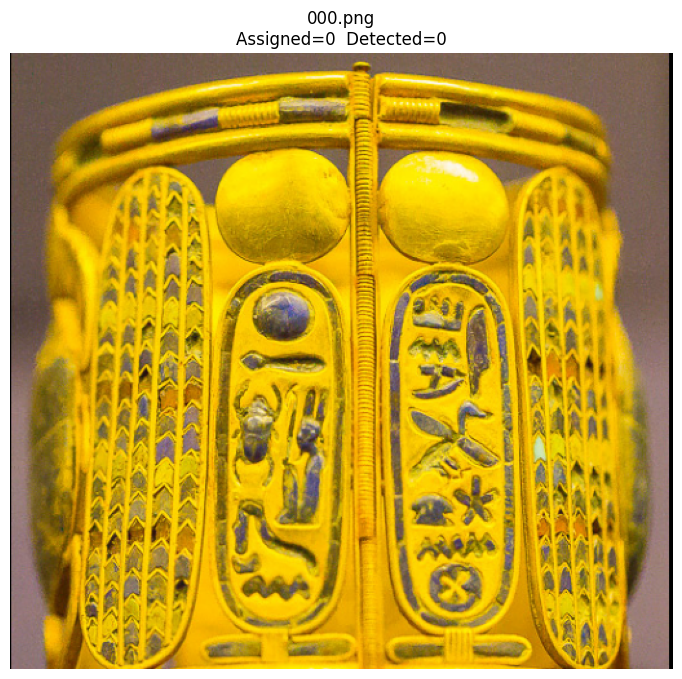

  Layout: 0 lines  |  2 cartouches (skipped)

001.png
Lines            : 0
Assigned signs   : 0
Detected boxes   : 0


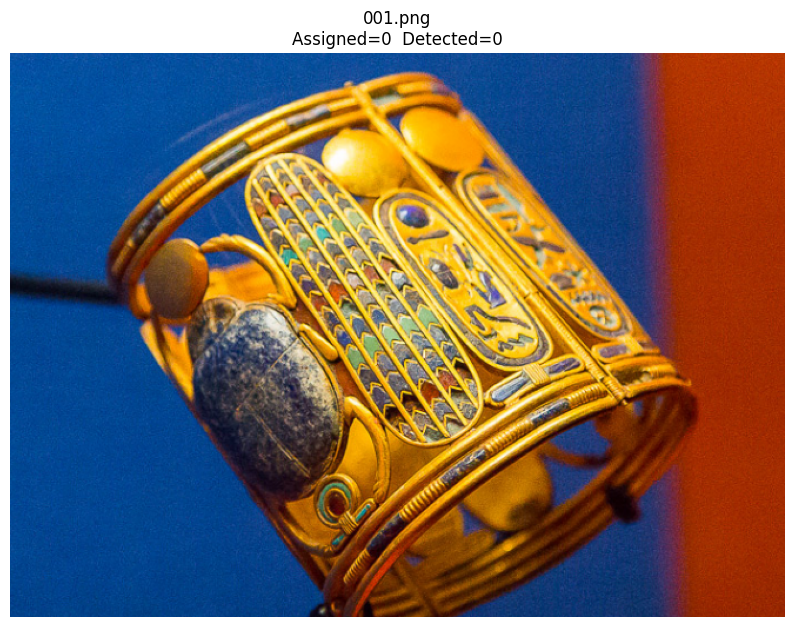

  Layout: 30 lines  |  0 cartouches (skipped)

009.png
Lines            : 30
Assigned signs   : 711
Detected boxes   : 727


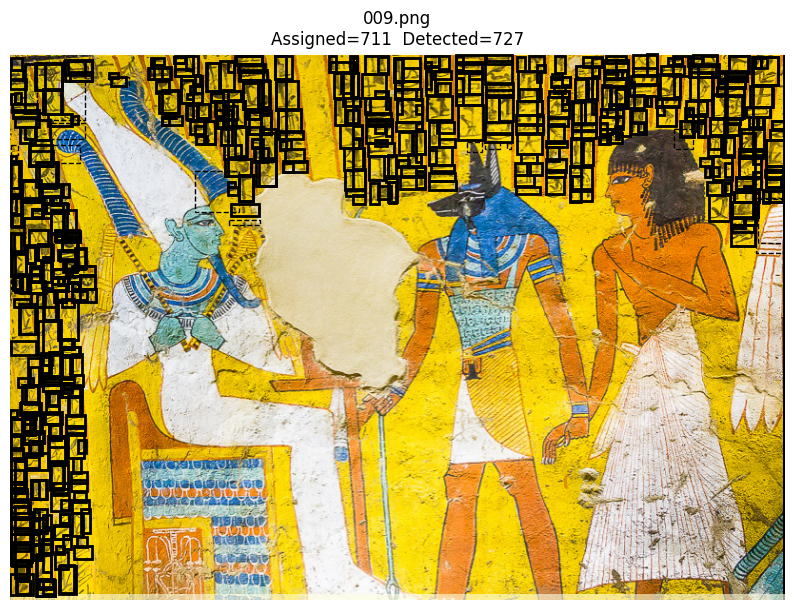

  Layout: 3 lines  |  5 cartouches (skipped)

018.png
Lines            : 3
Assigned signs   : 6
Detected boxes   : 29


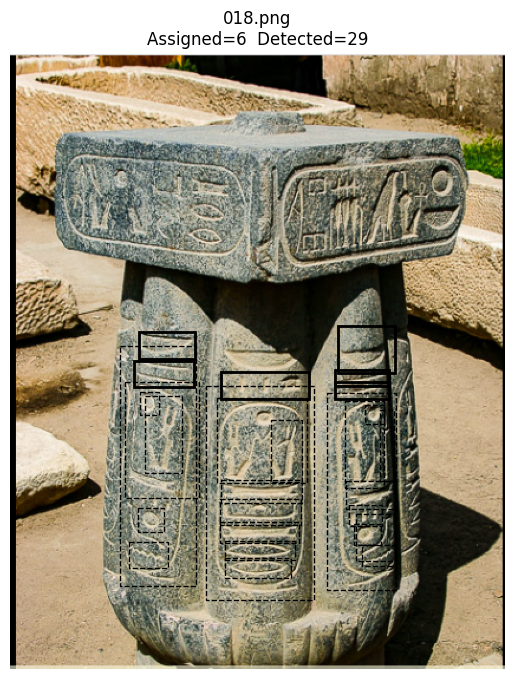

  Layout: 18 lines  |  0 cartouches (skipped)

01903f7df63648fc8f55be60220825e8.full.jpg
Lines            : 18
Assigned signs   : 169
Detected boxes   : 172


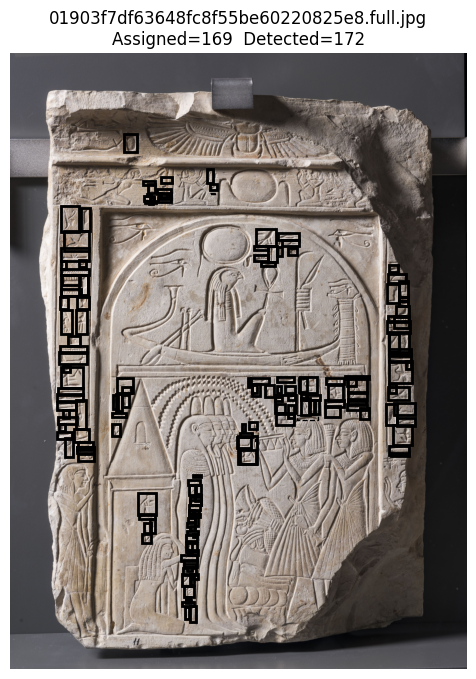

In [16]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

for img_path in sorted(Path(CARTIUCHE_DIR).glob("*"))[:5]:

    ordered_lines, artifact_dir, sign_boxes = run_pipeline(
        str(img_path),
        verbose=False
    )

    total_assigned = sum(len(l["signs"]) for l in ordered_lines)

    print(f"\n{img_path.name}")
    print(f"Lines            : {len(ordered_lines)}")
    print(f"Assigned signs   : {total_assigned}")
    print(f"Detected boxes   : {len(sign_boxes)}")

    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(figsize=(10,8))
    ax.imshow(img)

    # all detections
    for b in sign_boxes:
        x1,y1,x2,y2 = b[:4]          # box = [x1,y1,x2,y2,conf] → take first 4
        ax.add_patch(
            patches.Rectangle(
                (x1,y1),
                x2-x1,
                y2-y1,
                fill=False,
                linestyle="--",
                linewidth=1
            )
        )

    # assigned only
    for ln in ordered_lines:
        lx1, ly1, _, _ = ln["bbox"]

        for s in ln["signs"]:
            sx1, sy1, sx2, sy2 = s["bbox"]

            ax.add_patch(
                patches.Rectangle(
                    (lx1+sx1, ly1+sy1),
                    sx2-sx1,
                    sy2-sy1,
                    fill=False,
                    linewidth=2
                )
            )

    ax.set_title(
        f"{img_path.name}\n"
        f"Assigned={total_assigned}  Detected={len(sign_boxes)}"
    )

    ax.axis("off")
    plt.show()

  Layout: 1 lines  |  0 cartouches (skipped)
IMG-20260515-WA0044.jpg  |  42 signs  |  dir=RTL
Saved → results/pipeline_output.png


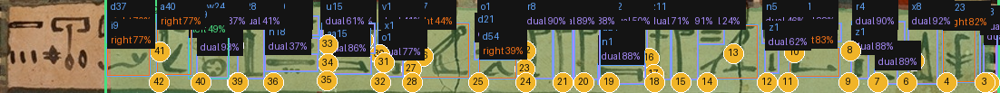

In [17]:
# ================================================================
#  Visualisation \u2014 green LINE overlay + labelled glyph boxes
#  (PIL annotation, identical look to the local pipeline.py output)
# ================================================================
import os
import numpy as np
import cv2
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

os.makedirs("results", exist_ok=True)

# \u2500\u2500 Palette (matches pipeline.py) \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
LAYOUT_COLORS = {
    "LINE":      (74,  222, 128),    # green
    "CARTOUCHE": (251, 191,  36),    # amber / gold
}
DIR_COLORS = {
    "left":  "#4ade80",
    "right": "#f97316",
    "dual":  "#a78bfa",
}
GLYPH_BOX_COLOR = "#60a5fa"          # blue glyph box
TEXT_BG         = (20, 20, 20, 210)  # dark label background
MASK_ALPHA      = 70                 # green-fill transparency (0-255)


def _load_fonts(size_big=15, size_small=12):
    big = ["/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf",
           "C:/Windows/Fonts/arialbd.ttf", "C:/Windows/Fonts/arial.ttf"]
    sml = ["/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
           "C:/Windows/Fonts/arial.ttf"]
    fb = fs = None
    for p in big:
        try: fb = ImageFont.truetype(p, size_big); break
        except Exception: pass
    for p in sml:
        try: fs = ImageFont.truetype(p, size_small); break
        except Exception: pass
    return (fb or ImageFont.load_default()), (fs or ImageFont.load_default())


def visualise_pipeline(image_path, ordered_lines, sign_boxes=None,
                       out_path=None, show=True):
    """Annotate the pipeline result in pipeline.py's style:
       green LINE region (filled + boxed + header), blue glyph boxes with
       direction-coloured labels, and gold reading-order badges."""
    base = Image.open(image_path).convert("RGB")
    W, H = base.size
    annotated = base.convert("RGBA")

    # 1) Semi-transparent green fill per line region (use seg polygon if present)
    for ln in ordered_lines:
        rtype = "CARTOUCHE" if ln.get("is_cartouche") else "LINE"
        col   = LAYOUT_COLORS.get(rtype, (200, 200, 200))
        rx1, ry1, rx2, ry2 = (int(v) for v in ln["bbox"])
        mask = np.zeros((H, W), dtype=bool)
        poly = ln.get("poly")
        if poly is not None and len(poly) >= 3:
            m = np.zeros((H, W), np.uint8)
            cv2.fillPoly(m, [np.asarray(poly, dtype=np.int32)], 255)
            mask = m > 127
        else:
            mask[max(0, ry1):ry2, max(0, rx1):rx2] = True
        overlay = np.zeros((H, W, 4), dtype=np.uint8)
        overlay[mask] = (*col, MASK_ALPHA)
        annotated = Image.alpha_composite(annotated, Image.fromarray(overlay, "RGBA"))

    draw = ImageDraw.Draw(annotated, "RGBA")
    font_big, _ = _load_fonts(16, 12)
    font_med, _ = _load_fonts(13, 11)
    font_sm,  _ = _load_fonts(11, 9)

    # 2) Line region box + "[LINE] N glyph(s)" header
    for ln in ordered_lines:
        rtype   = "CARTOUCHE" if ln.get("is_cartouche") else "LINE"
        col     = LAYOUT_COLORS.get(rtype, (200, 200, 200))
        col_hex = "#{:02x}{:02x}{:02x}".format(*col)
        rx1, ry1, rx2, ry2 = (int(v) for v in ln["bbox"])
        draw.rectangle([rx1 - 3, ry1 - 3, rx2 + 3, ry2 + 3], outline=col_hex, width=3)

        lbl = f"[{rtype}] {len(ln['signs'])} glyph(s)"
        tw  = draw.textlength(lbl, font=font_big)
        ly  = max(0, ry1 - 24)
        draw.rectangle([rx1, ly, rx1 + tw + 12, ly + 24], fill=(*col, 230))
        draw.text((rx1 + 6, ly + 3), lbl, fill=(10, 10, 10), font=font_big)

    # 3) Glyph boxes + labels + gold reading-order badges
    for ln in ordered_lines:
        lx1, ly1 = ln["bbox"][0], ln["bbox"][1]
        for s in ln["signs"]:
            sx1, sy1, sx2, sy2 = s["bbox"]                 # line-crop coords
            gx1, gy1 = int(lx1 + sx1), int(ly1 + sy1)      # -> full-image coords
            gx2, gy2 = int(lx1 + sx2), int(ly1 + sy2)
            dir_col  = DIR_COLORS.get(s.get("direction"), "#ffffff")

            draw.rectangle([gx1 - 1, gy1 - 1, gx2 + 1, gy2 + 1],
                           outline=GLYPH_BOX_COLOR, width=2)
            draw.rectangle([gx1, gy1, gx2, gy2], outline=dir_col, width=1)

            glbl = s.get("gardiner", "?")
            gsub = f"{s.get('direction', '?')} {s.get('sign_conf', 0) * 100:.0f}%"
            tw   = max(draw.textlength(glbl, font=font_med),
                       draw.textlength(gsub, font=font_sm))
            tly  = max(0, gy1 - 32)
            draw.rectangle([gx1, tly, gx1 + tw + 8, tly + 32], fill=TEXT_BG)
            draw.text((gx1 + 4, tly + 1),  glbl, fill=GLYPH_BOX_COLOR, font=font_med)
            draw.text((gx1 + 4, tly + 17), gsub, fill=dir_col,         font=font_sm)

            pos = s.get("position")
            if pos:
                br = 11
                cx = min(gx2 + br, W - br - 1)
                cy = min(gy2 + br, H - br - 1)
                draw.ellipse([cx - br, cy - br, cx + br, cy + br],
                             fill=(240, 180, 40, 235),
                             outline=(255, 255, 255, 190), width=1)
                pw = draw.textlength(str(pos), font=font_sm)
                draw.text((cx - pw / 2, cy - 7), str(pos),
                          fill=(10, 10, 10, 255), font=font_sm)

    annotated = annotated.convert("RGB")
    if out_path:
        annotated.save(out_path)
        print(f"Saved \u2192 {out_path}")
    if show:
        display(annotated)
    return annotated


# \u2500\u2500 Quick demo: re-run on TEST_IMAGE so geometry matches the pixels \u2500\u2500
if "run_pipeline" in dir():
    _ol, _ad, _sb = run_pipeline(TEST_IMAGE, layout_conf=0.25,
                                 sign_conf=0.25, verbose=False)
    print(f"{Path(TEST_IMAGE).name}  |  "
          f"{sum(len(l['signs']) for l in _ol)} signs  |  "
          f"dir={_ad.upper() if _ad else '?'}")
    visualise_pipeline(TEST_IMAGE, _ol, _sb, out_path="results/pipeline_output.png")
else:
    print("Run Cells 1\u20138 first to define run_pipeline().")


IMG-20260515-WA0044.jpg
  Layout: 1 lines  |  0 cartouches (skipped)
Direction: rtl
Lines: 1
Signs: 42

Transcription:
z1 q3 m23 x8 r4 x1 z1 d21 d36 n5 z1 g17 v13 r8 z11 d2 d21 n1 r8 r8 r8 o1 d21 d54 g17 v1 x1 o1 x1 u15 u15 aa15 v30 o29 n18 o28 w24 o49 o49 a40 d37 i9


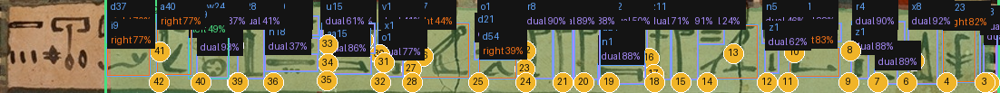

IMG-20260515-WA0045.jpg
  Layout: 1 lines  |  0 cartouches (skipped)
Direction: rtl
Lines: 1
Signs: 28

Transcription:
g17 q3 n1 x1 x1 n1 e34 g17 x1 o1 n14 n18 d28 n1 y4 f12 z2 g38 g17 o1 z1 m17 y5 y2 f32 o34 n37 n14


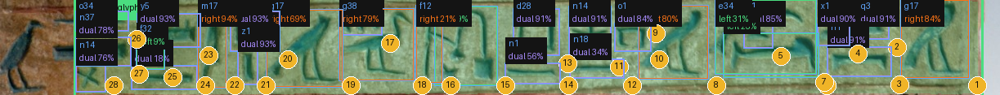

photo_2026-05-15_15-23-19.jpg
  Layout: 4 lines  |  0 cartouches (skipped)
Direction: rtl
Lines: 4
Signs: 81

Transcription:
g25 g17 x1 s29 n18 n18 g17 v28 d58 w17 v30 g17 | d35 o34 q3 s21 d21 s21 n35 f1 g43 y2 z1 z2 i9 f13 q3 d2 m23 m23 n35 i10 | d36 v28 x1 d39 q3 n35 x1 n1 o1 d36 z1 z2 z1 n33 g17 d36 g43 z2 q3 n35 q3 d2 s29 n35 d21 d60 d36 | n35 d36 x1 o1 m17 g17 n35 s29 d60 a1 d35 n35 q1 x1 o1 r8 m17 g17 n35 s29 r8 u33


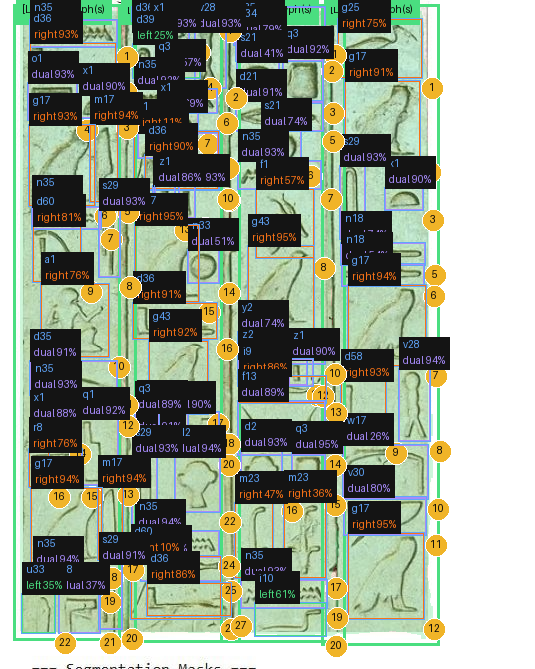

photo_2026-05-15_15-23-27.jpg
  Layout: 1 lines  |  0 cartouches (skipped)
Direction: rtl
Lines: 1
Signs: 23

Transcription:
p8 m17 n35 g5 aa15 v31 n29 d37 x1 v30 q3 q3 v31 d21 i10 p8 m17 n35 g5 v30 v13 m16 x7


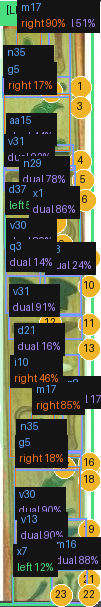

photo_2026-05-15_15-42-53.jpg
  Layout: 1 lines  |  0 cartouches (skipped)
Direction: rtl
Lines: 1
Signs: 12

Transcription:
m17 g43 w11 d21 x1 w14 g43 y2 n35 o29 z1 g5


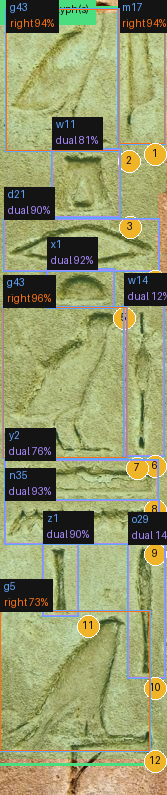

In [18]:
IMAGE_DIR = "/kaggle/input/datasets/hebaadelali/testimgs-ds"
from pathlib import Path

image_paths = []

for ext in ["*.jpg","*.jpeg","*.png"]:
    image_paths.extend(Path(IMAGE_DIR).glob(ext))

for img_path in sorted(image_paths[:10]):

    print("="*80)
    print(img_path.name)

    ordered_lines, artifact_dir, sign_boxes = run_pipeline(
        image_path=str(img_path),
        layout_conf=0.25,
        sign_conf=0.25,
        verbose=False
    )

    print("Direction:", artifact_dir)
    print("Lines:", len(ordered_lines))
    print("Signs:", sum(len(l["signs"]) for l in ordered_lines))

    print("\nTranscription:")
    print(transcription_string(ordered_lines))

    visualise_pipeline(
        str(img_path),
        ordered_lines,
        sign_boxes
    )

In [19]:
for ln in ordered_lines:

    print("\nLine", ln["line_no"])

    for i, s in enumerate(ln["signs"]):
        print(
            i,
            s["gardiner"],
            s["bbox"]
        )


Line 1
0 m17 (118.93425750732422, 0.0, 164.0444793701172, 134.96507263183594)
1 g43 (6.223729610443115, 0.0, 118.94776153564453, 141.80677795410156)
2 w11 (52.61545181274414, 140.44705200195312, 119.8942642211914, 207.72885131835938)
3 d21 (4.75799036026001, 210.0428466796875, 158.42823791503906, 261.6165771484375)
4 x1 (47.85249710083008, 260.60870361328125, 113.06005859375, 298.1630554199219)
5 w14 (124.5482406616211, 296.11358642578125, 163.27476501464844, 446.5782470703125)
6 g43 (3.9297146797180176, 298.3852233886719, 126.00035858154297, 448.1048889160156)
7 y2 (5.2777276039123535, 451.6571044921875, 157.40359497070312, 490.706298828125)
8 n35 (5.785543918609619, 491.8615417480469, 158.4029083251953, 534.3389282226562)
9 o29 (128.51803588867188, 535.412353515625, 164.95938110351562, 668.51318359375)
10 z1 (43.775421142578125, 534.1580200195312, 77.33692932128906, 606.98291015625)
11 g5 (0.07507462054491043, 602.9016723632812, 149.91403198242188, 741.9644165039062)


In [20]:
# ============================================================
# Single-image inference: اختار صورة من جهازك وشغّل الـ pipeline عليها
# ============================================================
import tempfile
from pathlib import Path
import ipywidgets as widgets
from IPython.display import display, clear_output

uploader = widgets.FileUpload(
    accept="image/*",   # jpg / jpeg / png
    multiple=False,     # صورة واحدة بس
    description="اختار صورة",
)
run_btn = widgets.Button(description="Run pipeline", button_style="success")
out = widgets.Output()


def _extract_uploaded_file(up):
    """يرجّع (filename, file_bytes) ويتعامل مع ipywidgets v7 و v8."""
    val = up.value
    if not val:
        return None, None
    if isinstance(val, (tuple, list)):           # ipywidgets v8: tuple of dicts
        item = val[0]
        return item["name"], bytes(item["content"])
    fname = next(iter(val))                        # ipywidgets v7: dict keyed by filename
    return fname, bytes(val[fname]["content"])


def on_run_clicked(_):
    with out:
        clear_output(wait=True)
        fname, data = _extract_uploaded_file(uploader)
        if data is None:
            print("⚠️ مفيش صورة مترفعة. ارفع صورة الأول من زرار الـ upload.")
            return

        # run_pipeline بياخد path، فبنحفظ الصورة في ملف مؤقت
        suffix = Path(fname).suffix or ".png"
        tmp = tempfile.NamedTemporaryFile(delete=False, suffix=suffix)
        tmp.write(data)
        tmp.close()
        img_path = tmp.name

        print("=" * 80)
        print(fname)
        ordered_lines, artifact_dir, sign_boxes = run_pipeline(
            image_path=img_path,
            layout_conf=0.25,
            sign_conf=0.25,
            verbose=False,
        )
        print("Direction:", artifact_dir)
        print("Lines:", len(ordered_lines))
        print("Signs:", sum(len(l["signs"]) for l in ordered_lines))
        print("\nTranscription:")
        print(transcription_string(ordered_lines))
        visualise_pipeline(img_path, ordered_lines, sign_boxes)


run_btn.on_click(on_run_clicked)
display(widgets.VBox([uploader, run_btn, out]))